In [6]:
import pandas as pd

1. Import the "Stock_Prices.csv" dataset.

In [7]:
df = pd.read_csv("Stock_Prices.csv")

2. Explore the dataset to understand its structure and content.

In [8]:
print(df)
print(df.info())

              Date   Open   High    Low  Close    Volume Name
0       08-02-2013  15.07  15.12  14.63  14.75   8407500  AAL
1       11-02-2013  14.89  15.01  14.26  14.46   8882000  AAL
2       12-02-2013  14.45  14.51  14.10  14.27   8126000  AAL
3       13-02-2013  14.30  14.94  14.25  14.66  10259500  AAL
4       14-02-2013  14.94  14.96  13.16  13.99  31879900  AAL
...            ...    ...    ...    ...    ...       ...  ...
619035  01-02-2018  76.84  78.27  76.69  77.82   2982259  ZTS
619036  02-02-2018  77.53  78.12  76.73  76.78   2595187  ZTS
619037  05-02-2018  76.64  76.92  73.18  73.83   2962031  ZTS
619038  06-02-2018  72.74  74.56  72.13  73.27   4924323  ZTS
619039  07-02-2018  72.70  75.00  72.69  73.86   4534912  ZTS

[619040 rows x 7 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619040 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Date    619040 non-null  object 
 1   

4. Plot line charts or time series plots to visualize the historical stock price trends over
time.

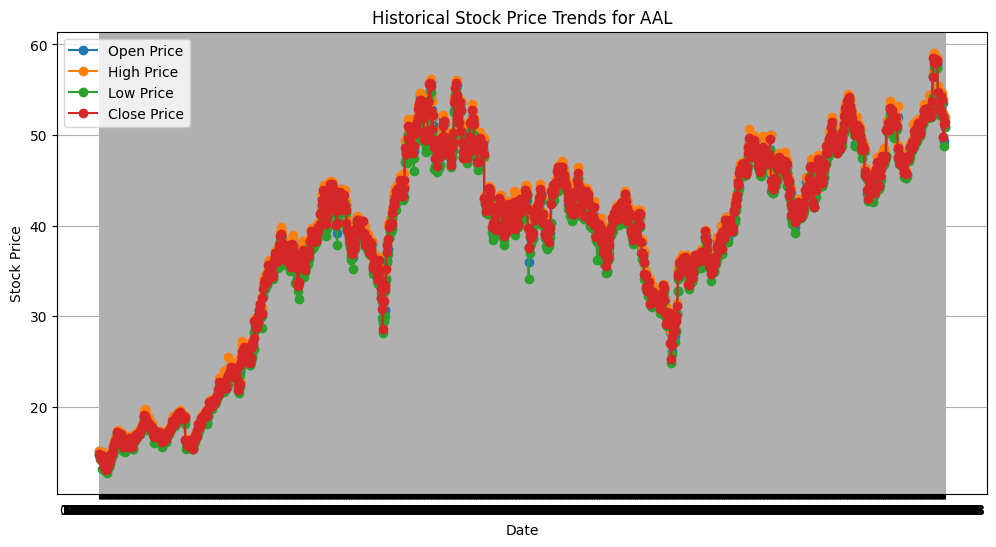

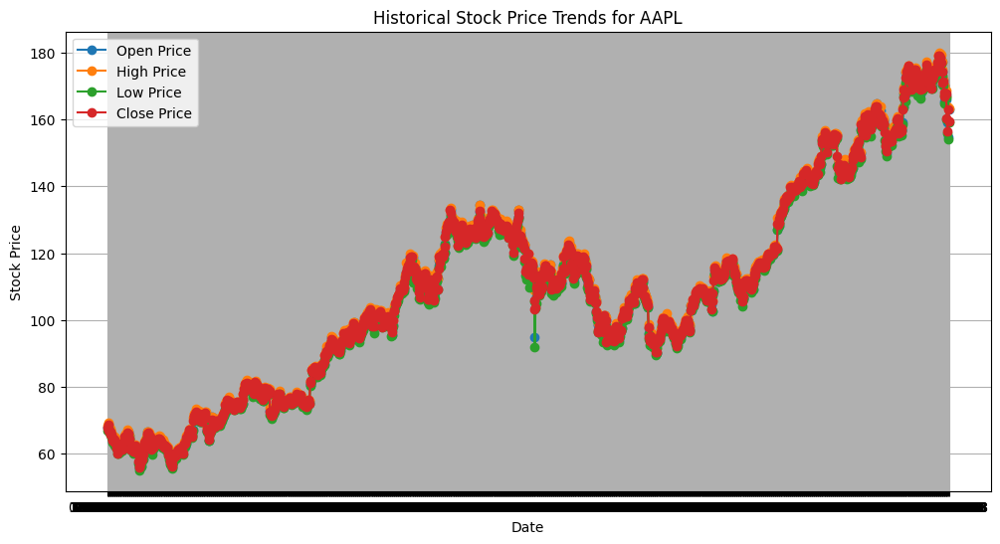

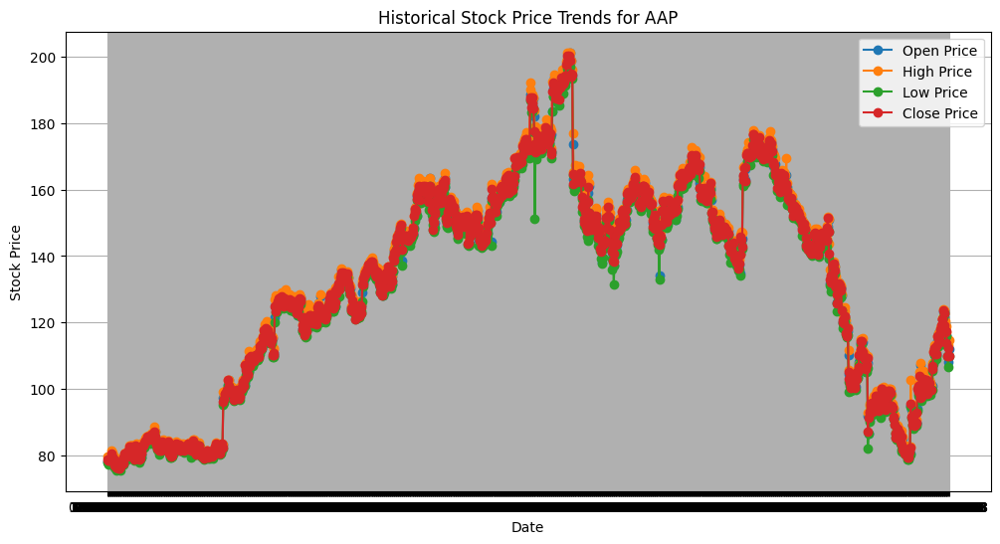

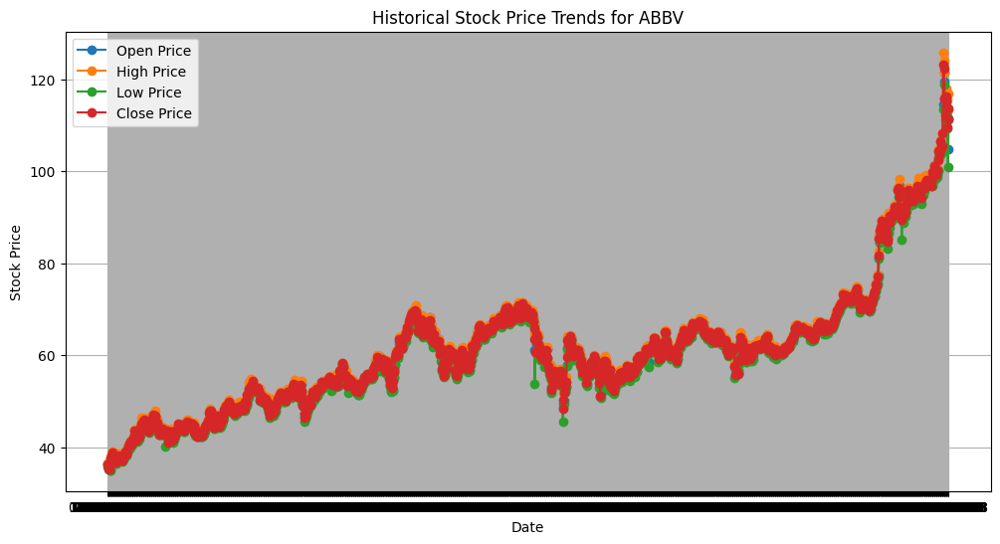

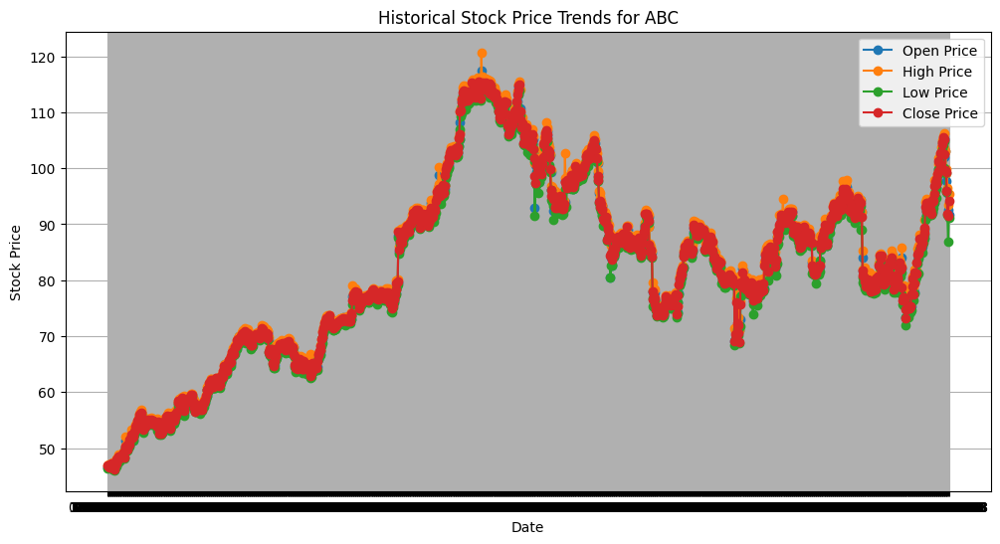

...

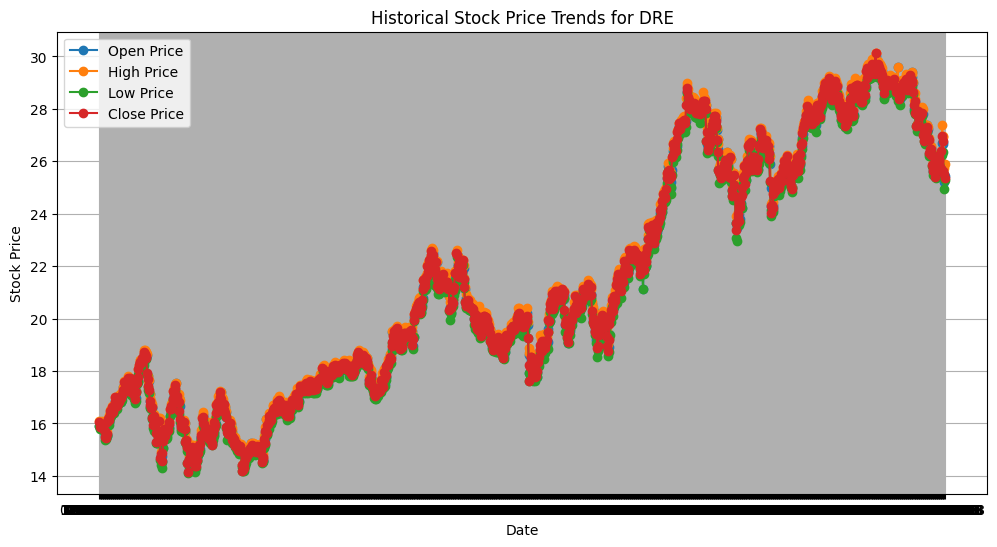

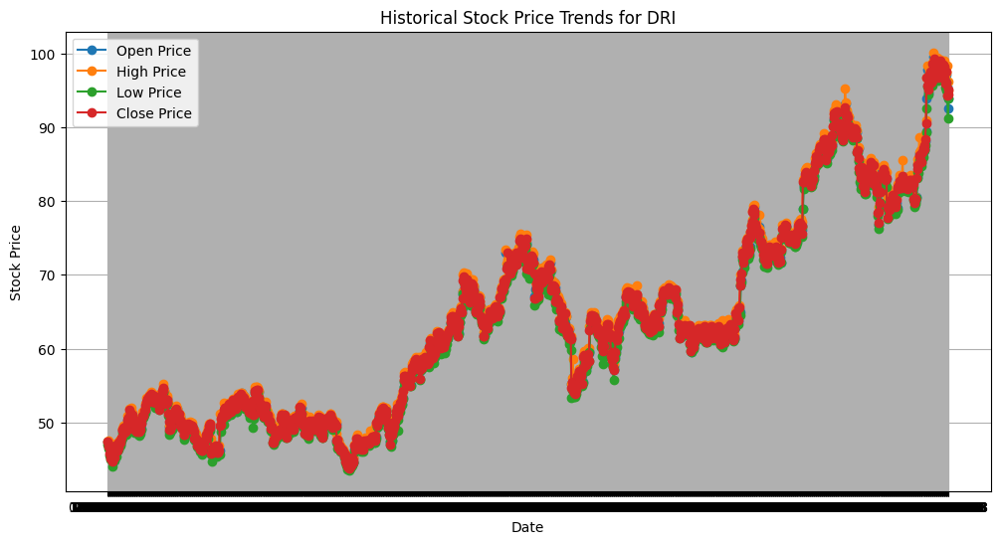

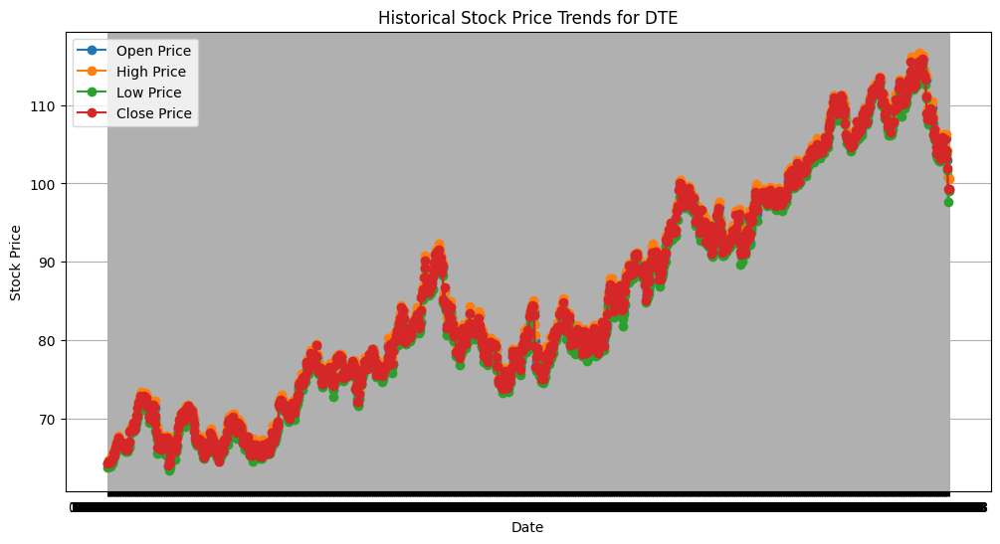

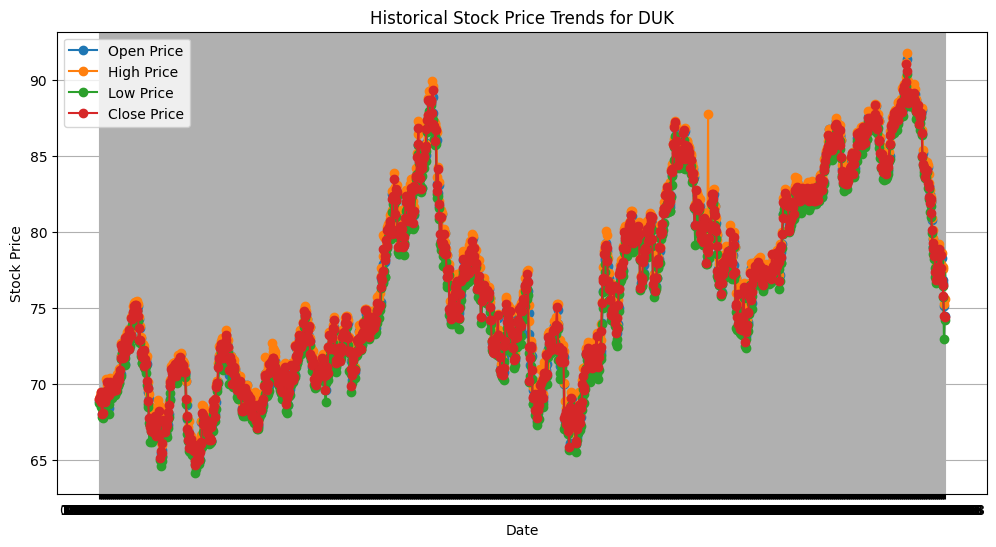

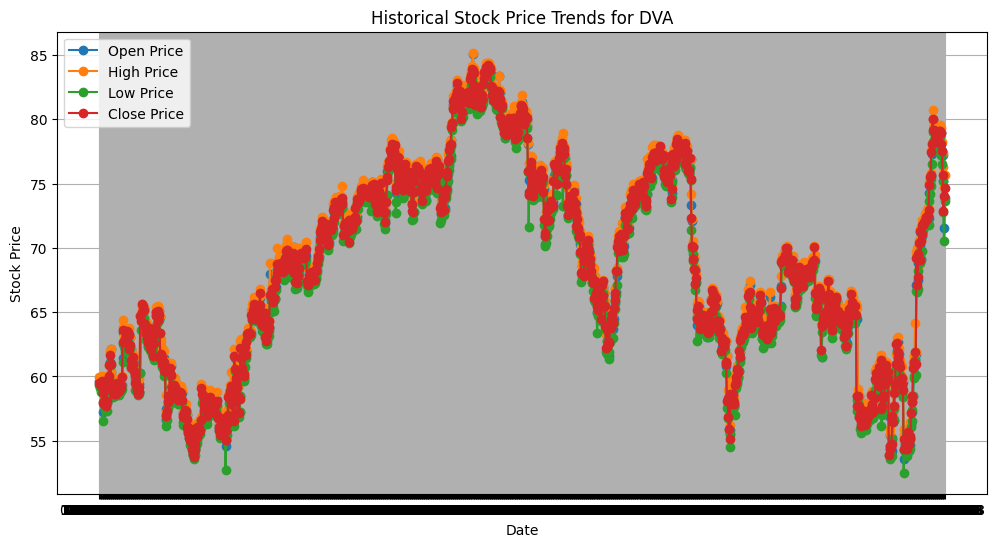

KeyboardInterrupt: 

In [11]:
import matplotlib.pyplot as plt
unique_stocks = df['Name'].unique()
for stock_name in unique_stocks:
    stock_data = df[df['Name'] == stock_name]

    plt.figure(figsize=(12, 6))
    plt.plot(stock_data['Date'], stock_data['Open'], label='Open Price', linestyle='-', marker='o')
    plt.plot(stock_data['Date'], stock_data['High'], label='High Price', linestyle='-', marker='o')
    plt.plot(stock_data['Date'], stock_data['Low'], label='Low Price', linestyle='-', marker='o')
    plt.plot(stock_data['Date'], stock_data['Close'], label='Close Price', linestyle='-', marker='o')

    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.title(f'Historical Stock Price Trends for {stock_name}')
    plt.legend()
    plt.grid(True)
    plt.show()

5. Calculate and plot moving averages or rolling averages to identify the underlying
trends and smooth out noise

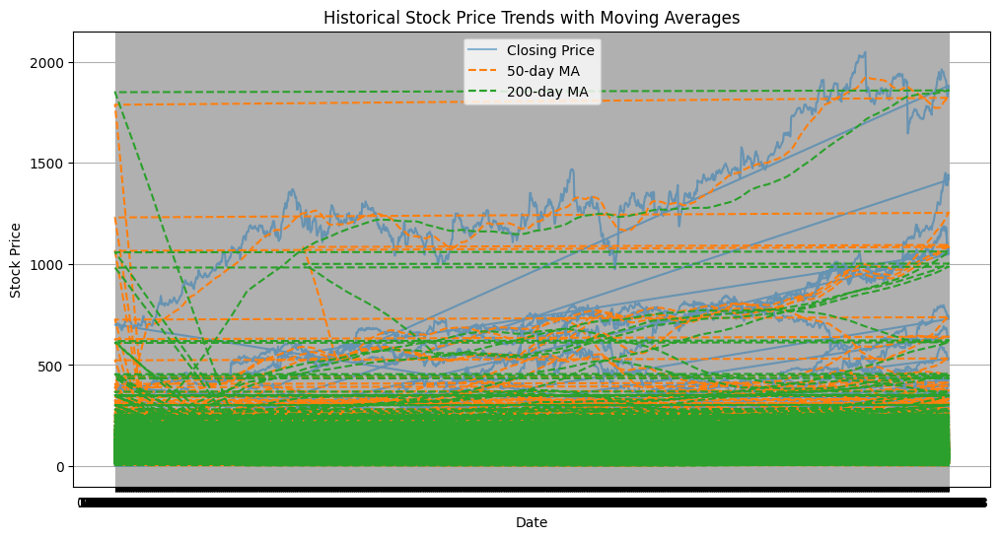

In [12]:
window_size_50 = 50
window_size_200 = 200

# Calculate moving averages
df['50_MA'] = df['Close'].rolling(window=window_size_50).mean()
df['200_MA'] = df['Close'].rolling(window=window_size_200).mean()

# Plotting historical stock prices and moving averages
plt.figure(figsize=(12, 6))
plt.plot(df['Date'], df['Close'], label='Closing Price', alpha=0.5)
plt.plot(df['Date'], df['50_MA'], label=f'{window_size_50}-day MA', linestyle='--')
plt.plot(df['Date'], df['200_MA'], label=f'{window_size_200}-day MA', linestyle='--')

plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Historical Stock Price Trends with Moving Averages')
plt.legend()
plt.grid(True)
plt.show()

6. Perform seasonality analysis to identify periodic patterns in the stock prices, such as
weekly, monthly, or yearly fluctuations.

7. Analyze and plot the correlation between the stock prices and other variables, such as
trading volume

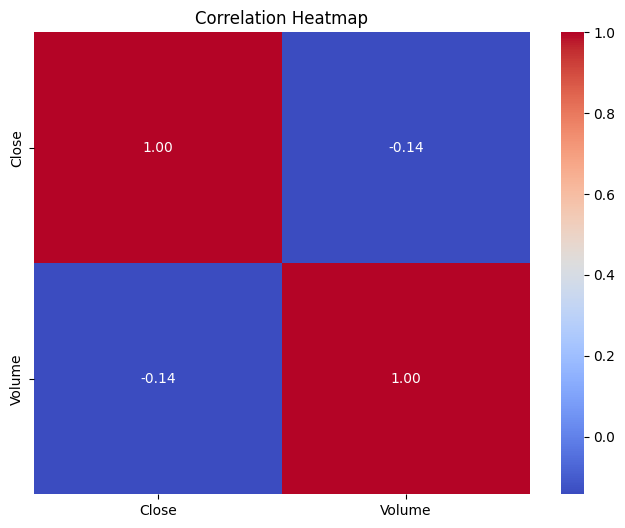

In [18]:
import seaborn as sns
correlation_matrix = df[['Close', 'Volume']].corr()

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

8. Use autoregressive integrated moving average (ARIMA) models or exponential
smoothing models to forecast future stock prices.

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt


In [20]:
target = df['Close']

In [21]:
# Split data into training and testing (e.g., 80% train, 20% test)
train_size = int(len(target) * 0.8)
train, test = target[:train_size], target[train_size:]


In [22]:
# Define ARIMA order parameters (p, d, q)
p, d, q = 1, 1, 1  # Example values; adjust based on model performance

# Fit the ARIMA model
model = ARIMA(train, order=(p, d, q))
model_fit = model.fit()


D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters fo

In [23]:
# Make predictions
predictions = model_fit.forecast(steps=len(test))

D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [24]:
# Calculate RMSE
rmse = sqrt(mean_squared_error(test, predictions))
print(f'Root Mean Squared Error (RMSE): {rmse}')


Root Mean Squared Error (RMSE): 52.405292329864466


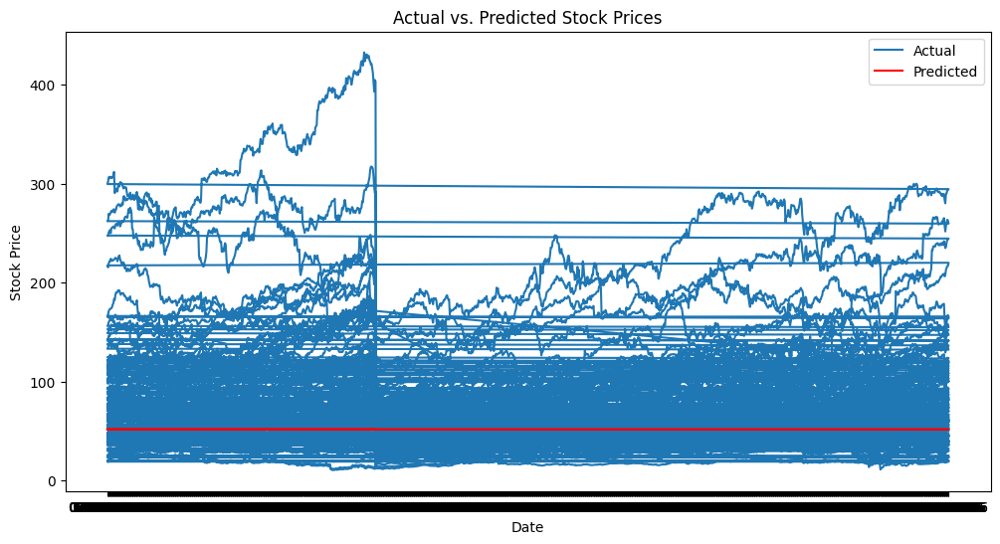

In [25]:
# Plot actual vs. predicted
plt.figure(figsize=(12, 6))
plt.plot(test.index, test.values, label='Actual')
plt.plot(test.index, predictions, label='Predicted', color='red')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Actual vs. Predicted Stock Prices')
plt.legend()
plt.show()


D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
D:\Ananconda\envs\myenv\lib\site-packa

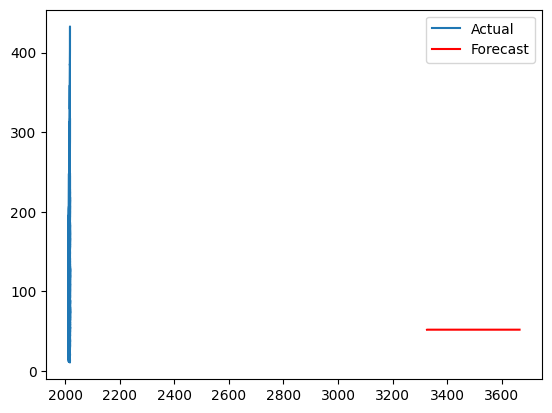

Root Mean Squared Error (RMSE): 52.370355532472665


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

# Load the data
data = pd.read_csv('Stock_Prices.csv')
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')  # Correct date format
data.set_index('Date', inplace=True)

# Split the data
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

# Fit ARIMA model
model = ARIMA(train['Close'], order=(5, 1, 0))
model_fit = model.fit()

# Forecast multiple steps ahead
forecast = model_fit.get_forecast(steps=len(test))
forecast_mean = forecast.predicted_mean

# Calculate RMSE
rmse = sqrt(mean_squared_error(test['Close'], forecast_mean))

# Visualize actual vs. forecasted data
plt.plot(test['Close'], label='Actual')
plt.plot(forecast_mean, label='Forecast', color='red')
plt.legend()
plt.show()

print(f'Root Mean Squared Error (RMSE): {rmse}')
